# Evaluation of ReInspect

Evaluation for end-to-end people detection in crowded scenes.

Let's start with importing the required files, seeding the random number generators and setting up the hyperparameters.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import cv2
import json
import numpy as np
import itertools
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from scipy.misc import imread
from IPython import display
import caffe
import apollocaffe # Make sure that caffe is on the python path:


In [4]:
from utils.annolist import AnnotationLib as al
from train import load_idl, forward
from utils import load_data_mean, Rect, stitch_rects

In [5]:
config = json.load(open("config.json", 'r'))
config["data"]["test_idl"] = "./data/brainwash/brainwash_test.idl"

apollocaffe.set_random_seed(config["solver"]["random_seed"])

In [18]:
config["data"]

{u'idl_mean': u'./data/brainwash_mean.npy',
 u'test_idl': './data/brainwash/brainwash_test.idl',
 u'train_idl': u'./data/brainwash/brainwash_train.idl'}

In [ ]:

apollocaffe.set_device(1)

2016-09-26 20:42:30 - GPU device 1


Now lets load the data mean and the data.

In [6]:
data_mean = load_data_mean(config["data"]["idl_mean"], 
                           config["net"]["img_width"], 
                           config["net"]["img_height"], image_scaling=1.0)

num_test_images = 500

# Warning: load_idl returns an infinite generator. Calling list() before islice() will hang.
test_list = list(itertools.islice(
        load_idl(config["data"]["test_idl"], data_mean, config["net"], False),
        0,
        num_test_images))

We can now load the snapshot weights.

In [7]:
net = apollocaffe.ApolloNet()
net.phase = 'test'
import time; s = time.time()
forward(net, test_list[0], config["net"], True)
print time.time() - s
net.load("./data/brainwash_800000.h5")

3.9294757843


In [45]:
#len(test_list)
type(test_list[344]['raw'])

numpy.ndarray

We can now begin to run the model and visualize the results.

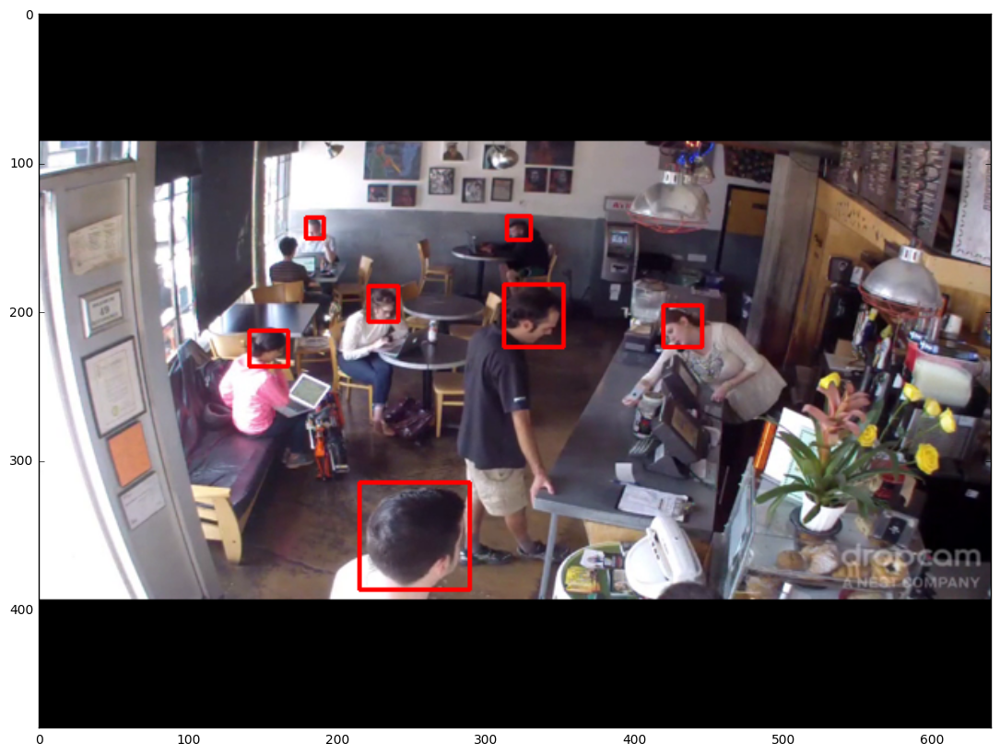

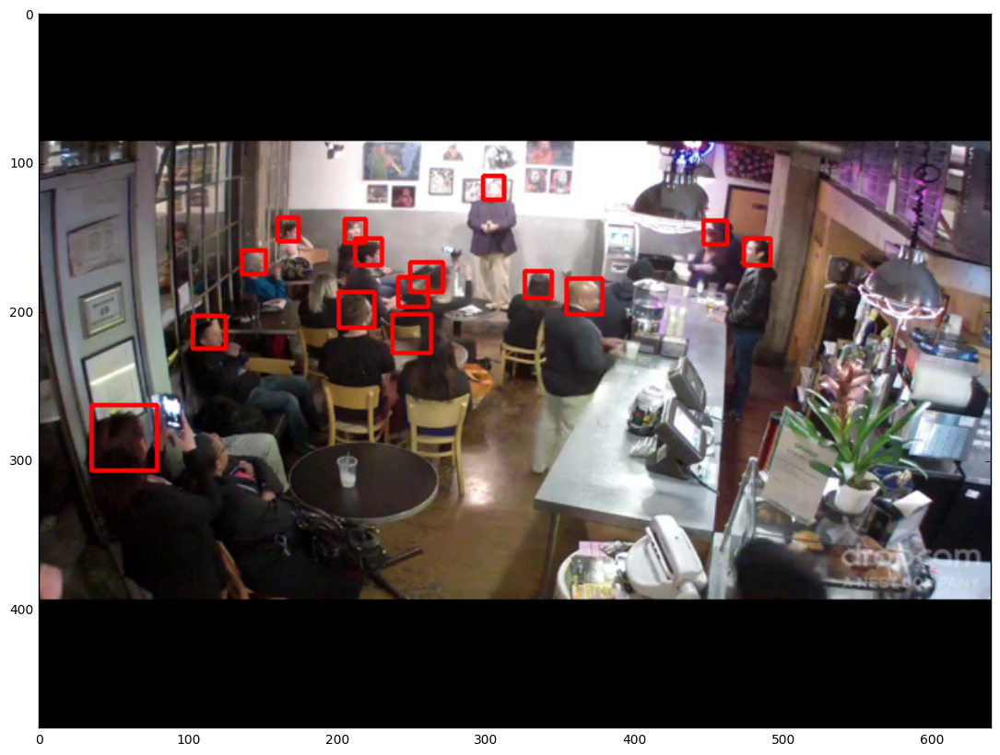

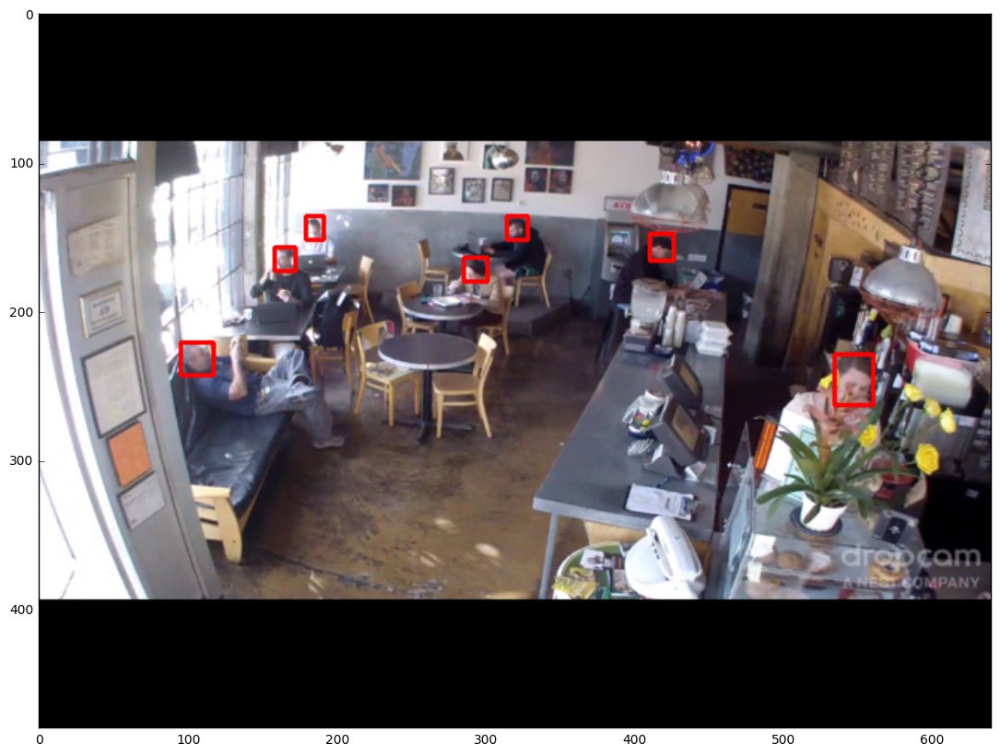

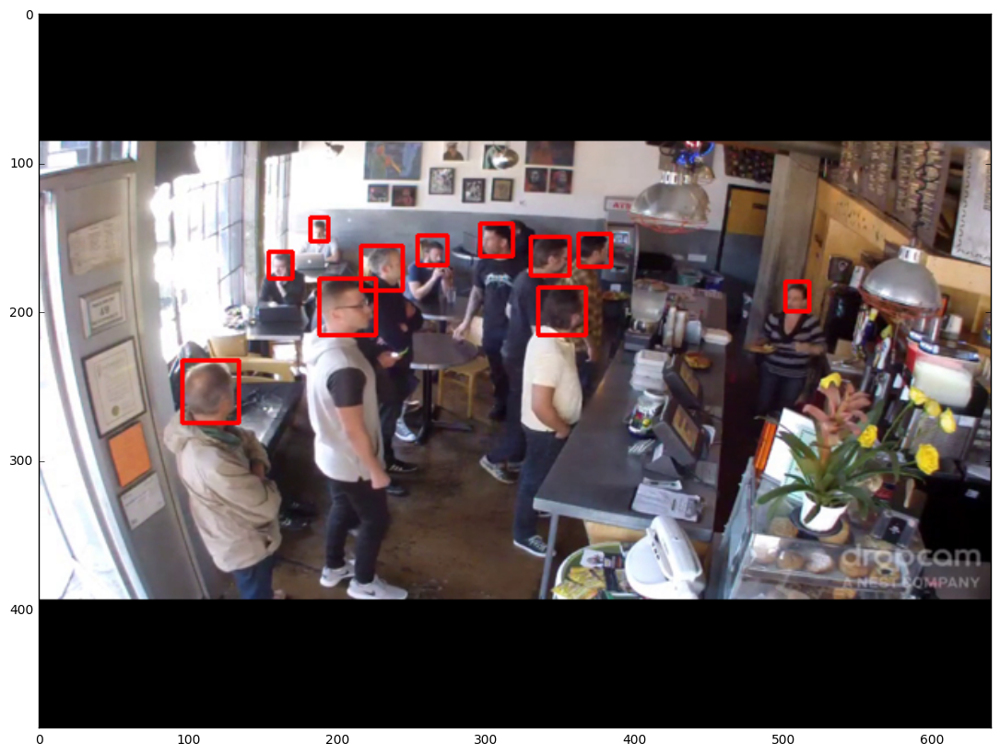

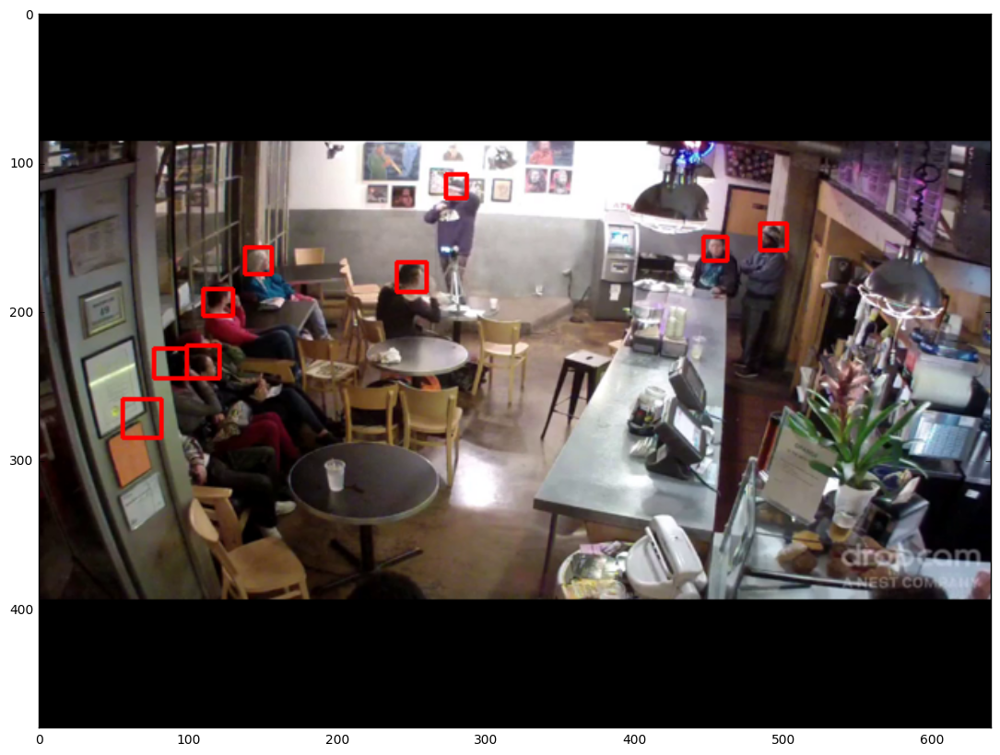

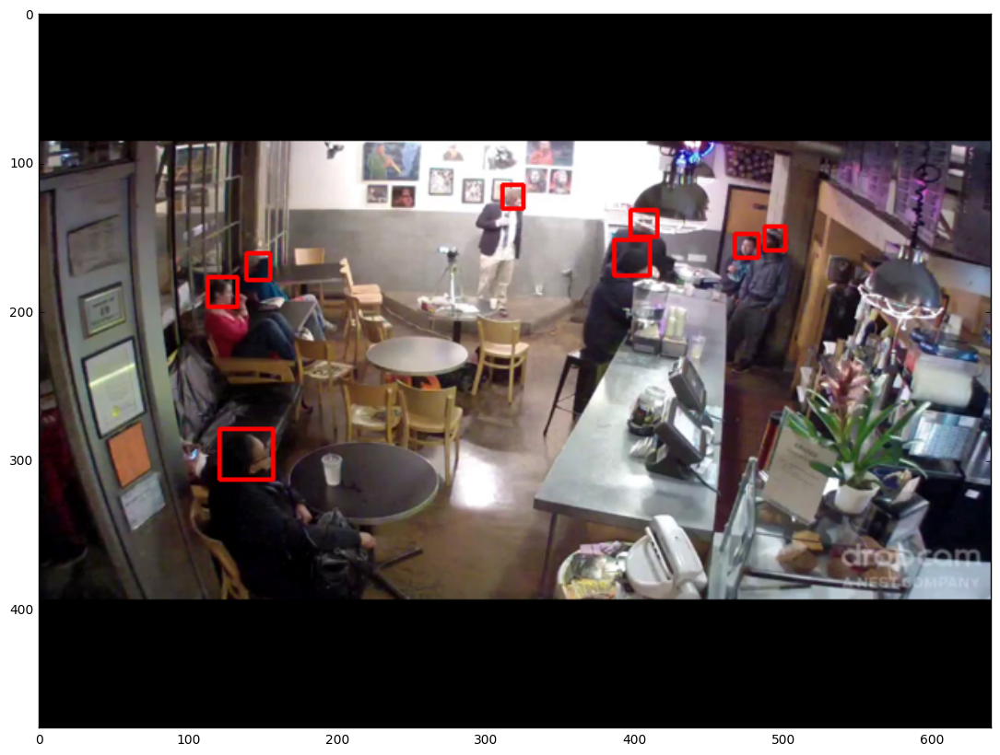

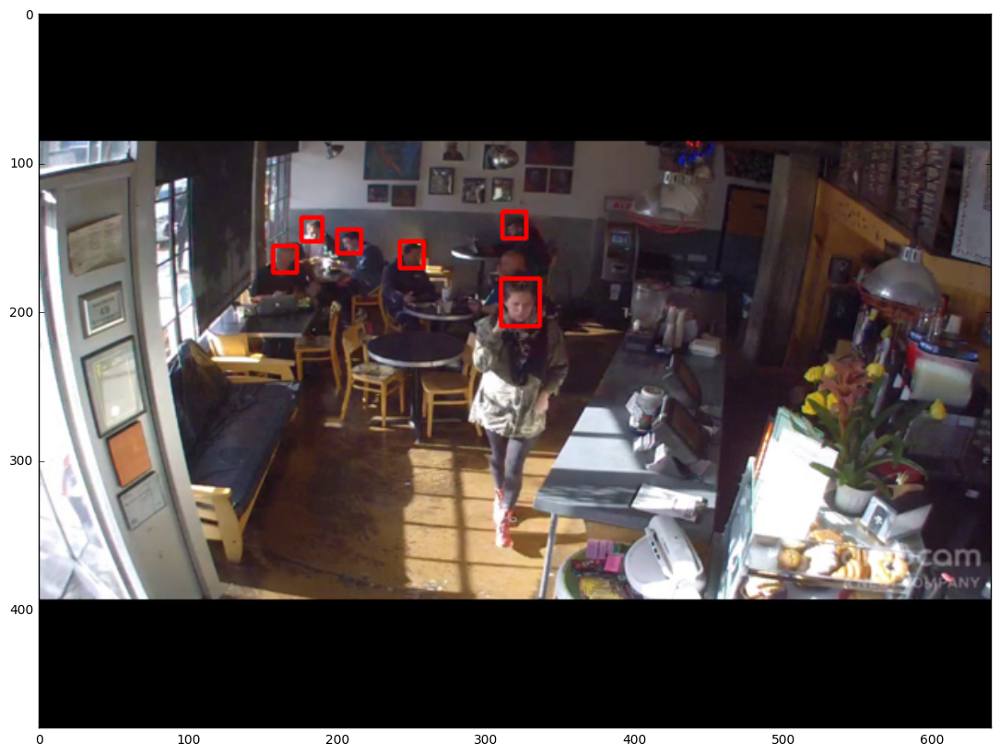

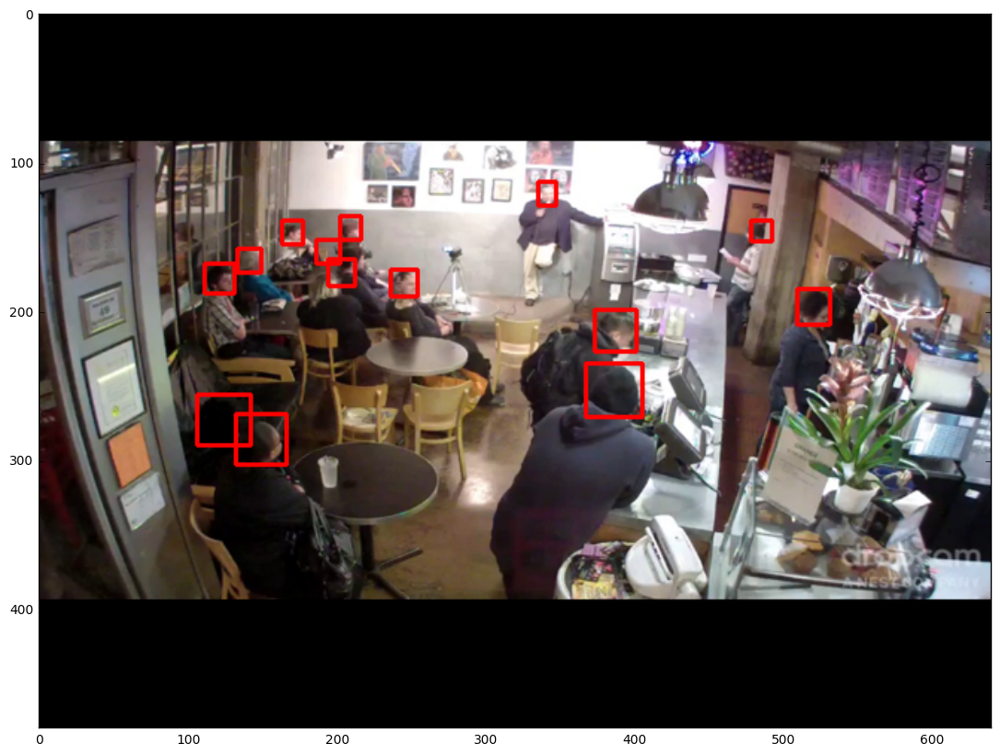

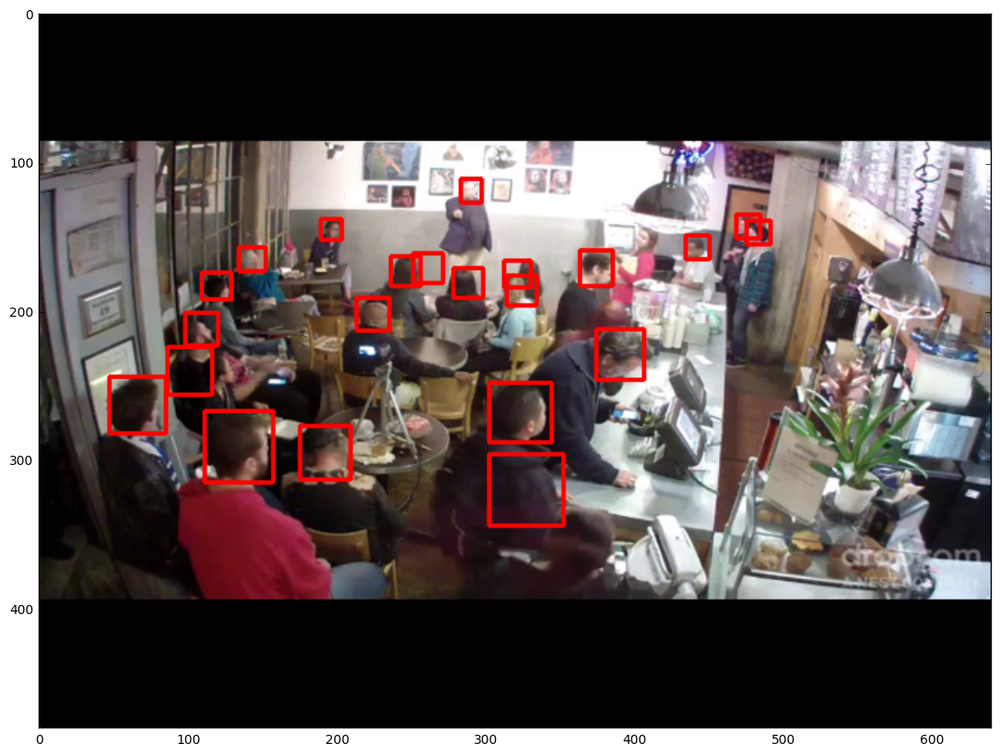

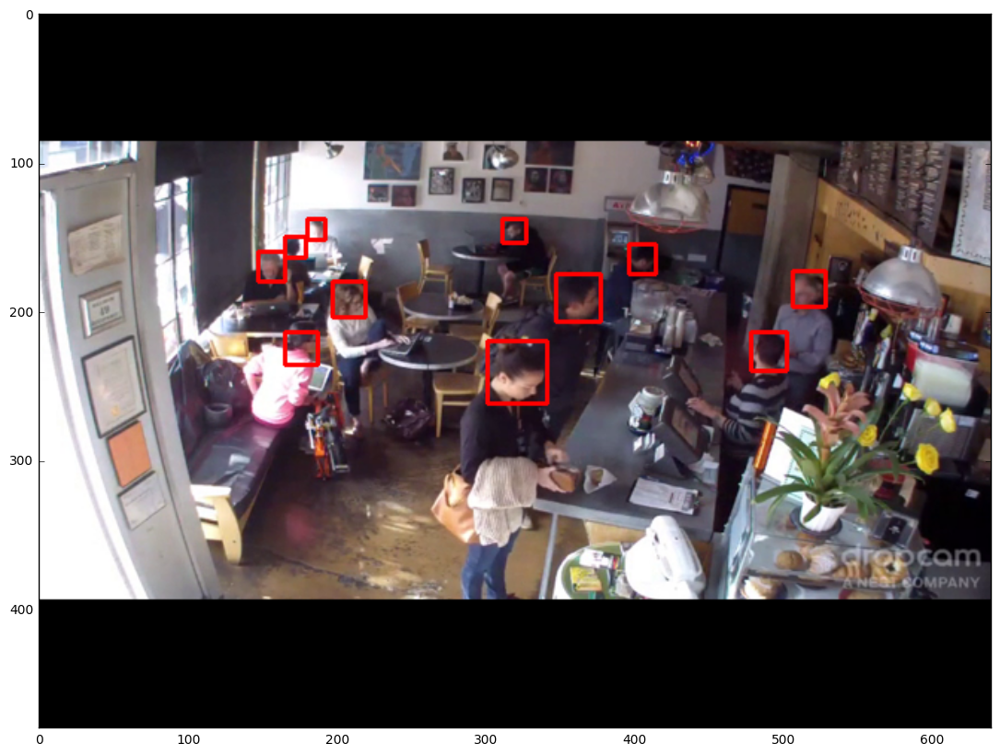

In [8]:
from utils import stitch_rects
annolist = al.AnnoList()
net_config = config["net"]
pix_per_w = net_config["img_width"]/net_config["grid_width"]
pix_per_h = net_config["img_height"]/net_config["grid_height"]

for i in range(10):
    inputs = test_list[i]
    bbox_list, conf_list = forward(net, inputs, net_config, True)
    
    img = np.copy(inputs["raw"])
    png = np.copy(inputs["imname"])
    all_rects = [[[] for x in range(net_config["grid_width"])] for y in range(net_config["grid_height"])]
    for n in range(len(bbox_list)):
        for k in range(net_config["grid_height"] * net_config["grid_width"]):
            y = int(k / net_config["grid_width"])
            x = int(k % net_config["grid_width"])
            bbox = bbox_list[n][k]
            conf = conf_list[n][k,1].flatten()[0]
            abs_cx = pix_per_w/2 + pix_per_w*x + int(bbox[0,0,0])
            abs_cy = pix_per_h/2 + pix_per_h*y+int(bbox[1,0,0])
            w = bbox[2,0,0]
            h = bbox[3,0,0]
            all_rects[y][x].append(Rect(abs_cx,abs_cy,w,h,conf))

    acc_rects = stitch_rects(all_rects)
    
    display = True
    if display:
        for rect in acc_rects:
            if rect.true_confidence < 0.8:
                continue
            cv2.rectangle(img, 
                          (rect.cx-int(rect.width/2), rect.cy-int(rect.height/2)), 
                          (rect.cx+int(rect.width/2), rect.cy+int(rect.height/2)), 
                          (255,0,0),
                          2)
     
        plt.figure(figsize=(15,10))
        plt.imshow(img)
        
    anno = al.Annotation()
    anno.imageName = inputs["imname"]
    for rect in acc_rects:
        r = al.AnnoRect()
        r.x1 = rect.cx - rect.width/2.
        r.x2 = rect.cx + rect.width/2.
        r.y1 = rect.cy - rect.height/2.
        r.y2 = rect.cy + rect.height/2.
        r.score = rect.true_confidence
        anno.rects.append(r)
    annolist.append(anno)

In [9]:
annolist.save('/tmp/predictions_test.idl')

saving:  /tmp/predictions_test.idl
